In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cufflinks as cf
from IPython.display import display,HTML

In [3]:
#Leo mi archivo.csv
Covid = pd.read_csv("COVID19Mexico.csv")
#Filtro por filas
Covid


/var/folders/km/_mk7wy_d31z7cvt46ch2p8mh0000gn/T/ipykernel_58907/2879279424.py:2: DtypeWarning:

Columns (39) have mixed types. Specify dtype option on import or set low_memory=False.



,Unnamed: 0,FECHA_ACTUALIZACION,ID_REGISTRO,ORIGEN,SECTOR,ENTIDAD_UM,SEXO,ENTIDAD_NAC,ENTIDAD_RES,MUNICIPIO_RES,...,OTRO_CASO,TOMA_MUESTRA_LAB,RESULTADO_LAB,TOMA_MUESTRA_ANTIGENO,RESULTADO_ANTIGENO,CLASIFICACION_FINAL,MIGRANTE,PAIS_NACIONALIDAD,PAIS_ORIGEN,UCI
0,0,27/08/22,1a4a8d,1,12.0,23.0,2.0,27,23,8.0,...,2.0,2,97,1,2.0,7,99,México,97,97
1,1,27/08/22,01e27d,2,9.0,25.0,2.0,25,25,1.0,...,2.0,2,97,1,2.0,7,99,México,97,97
2,2,27/08/22,13cf10,2,9.0,9.0,1.0,9,9,14.0,...,2.0,1,1,2,97.0,3,99,México,97,97
3,3,27/08/22,13c92b,2,12.0,9.0,1.0,9,9,2.0,...,1.0,2,97,1,2.0,7,99,México,97,97
4,4,27/08/22,04af5f,2,12.0,9.0,1.0,9,9,7.0,...,1.0,2,97,1,2.0,7,99,México,97,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,27/08/22,47548a,2,12.0,9.0,1.0,11,15,31.0,...,2.0,1,2,1,2.0,7,99,México,97,97
99996,99996,27/08/22,5c2773,2,NaN,9.0,2.0,15,15,95.0,...,1.0,2,97,1,2.0,7,99,México,97,97
99997,99997,27/08/22,aceb1f,2,4.0,NaN,2.0,28,28,22.0,...,1.0,2,97,1,1.0,3,99,México,97,97
99998,99998,27/08/22,db2a23,2,4.0,9.0,1.0,15,9,6.0,...,1.0,2,97,1,1.0,3,99,México,97,97


In [4]:
valores_nulos=Covid.isnull().sum()
valores_nulos

Unnamed: 0               0
FECHA_ACTUALIZACION      0
ID_REGISTRO              0
ORIGEN                   0
SECTOR                   1
ENTIDAD_UM               1
SEXO                     1
ENTIDAD_NAC              0
ENTIDAD_RES              0
MUNICIPIO_RES            1
TIPO_PACIENTE            0
FECHA_INGRESO            0
FECHA_SINTOMAS           0
FECHA_DEF                0
INTUBADO                 0
NEUMONIA                 0
EDAD                     3
NACIONALIDAD             0
EMBARAZO                 2
HABLA_LENGUA_INDIG       0
INDIGENA                 0
DIABETES                 0
EPOC                     0
ASMA                     0
INMUSUPR                 0
HIPERTENSION             1
OTRA_COM                 0
CARDIOVASCULAR           0
OBESIDAD                 0
RENAL_CRONICA            0
TABAQUISMO               1
OTRO_CASO                1
TOMA_MUESTRA_LAB         0
RESULTADO_LAB            0
TOMA_MUESTRA_ANTIGENO    0
RESULTADO_ANTIGENO       1
CLASIFICACION_FINAL      0
M

In [6]:
#Filtro por filas
data= Covid.iloc[0:100000,: ]
data

,Unnamed: 0,FECHA_ACTUALIZACION,ID_REGISTRO,ORIGEN,SECTOR,ENTIDAD_UM,SEXO,ENTIDAD_NAC,ENTIDAD_RES,MUNICIPIO_RES,...,OTRO_CASO,TOMA_MUESTRA_LAB,RESULTADO_LAB,TOMA_MUESTRA_ANTIGENO,RESULTADO_ANTIGENO,CLASIFICACION_FINAL,MIGRANTE,PAIS_NACIONALIDAD,PAIS_ORIGEN,UCI
0,0,27/08/22,1a4a8d,1,12.0,23.0,2.0,27,23,8.0,...,2.0,2,97,1,2.0,7,99,México,97,97
1,1,27/08/22,01e27d,2,9.0,25.0,2.0,25,25,1.0,...,2.0,2,97,1,2.0,7,99,México,97,97
2,2,27/08/22,13cf10,2,9.0,9.0,1.0,9,9,14.0,...,2.0,1,1,2,97.0,3,99,México,97,97
3,3,27/08/22,13c92b,2,12.0,9.0,1.0,9,9,2.0,...,1.0,2,97,1,2.0,7,99,México,97,97
4,4,27/08/22,04af5f,2,12.0,9.0,1.0,9,9,7.0,...,1.0,2,97,1,2.0,7,99,México,97,97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,27/08/22,47548a,2,12.0,9.0,1.0,11,15,31.0,...,2.0,1,2,1,2.0,7,99,México,97,97
99996,99996,27/08/22,5c2773,2,NaN,9.0,2.0,15,15,95.0,...,1.0,2,97,1,2.0,7,99,México,97,97
99997,99997,27/08/22,aceb1f,2,4.0,NaN,2.0,28,28,22.0,...,1.0,2,97,1,1.0,3,99,México,97,97
99998,99998,27/08/22,db2a23,2,4.0,9.0,1.0,15,9,6.0,...,1.0,2,97,1,1.0,3,99,México,97,97


In [7]:
#Copia de data frame
datacopy=data.copy()

*ELIMINACIÓN DE NULOS*

SUSTITUCIÓN CON MEDIA

In [8]:
#SECTOR
datacopy["SECTOR"]=datacopy["SECTOR"].fillna(round(data["SECTOR"].mean(),1))

In [9]:
#ENTIDAD_UM
datacopy["ENTIDAD_UM"]=datacopy["ENTIDAD_UM"].fillna(round(data["ENTIDAD_UM"].mean(),1))

In [10]:
#Sexo
datacopy["SEXO"]=datacopy["SEXO"].fillna(round(data["SEXO"].mean(),1))

In [11]:
#MUNICIPIO_RES
datacopy["MUNICIPIO_RES"]=datacopy["MUNICIPIO_RES"].fillna(round(data["MUNICIPIO_RES"].mean(),1))

*ELIMINACIÓN DE NULOS*

SUSTITUCIÓN CON Bfill

In [12]:
#EDAD
datacopy["EDAD"]=datacopy["EDAD"].fillna(method="bfill")

In [13]:
#EMBARAZO
datacopy["EMBARAZO"]=datacopy["EMBARAZO"].fillna(method="bfill")

In [14]:
#HIPERTENSION
datacopy["HIPERTENSION"]=datacopy["HIPERTENSION"].fillna(method="bfill")

In [15]:
#PAIS_NACIONALIDAD
datacopy["PAIS_NACIONALIDAD"]=datacopy["PAIS_NACIONALIDAD"].fillna(method="bfill")

*ELIMINACIÓN DE NULOS*

SUSTITUCIÓN CON ffill

In [19]:
#TABAQUISMO
datacopy["TABAQUISMO"]=datacopy["TABAQUISMO"].fillna(method="ffill")

In [16]:
#OTRO_CASO
datacopy["OTRO_CASO"]=datacopy["OTRO_CASO"].fillna(method="ffill")

In [17]:
#RESULTADO_ANTIGENO
datacopy["RESULTADO_ANTIGENO"]=datacopy["RESULTADO_ANTIGENO"].fillna(method="ffill")

In [ ]:
#Identificación de valores nulos
valoresnull=datacopy.isnull().sum()
valoresnull

*VALORES ATÍPICOS 
Y SU ELIMINACIóN*

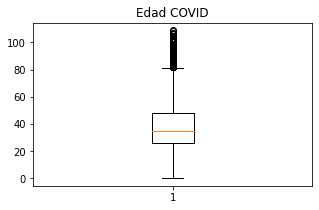

In [23]:
#Diagrama de caja para la identificación de outliers
fig = plt.figure(figsize =(5, 3)) 
plt.boxplot(datacopy["EDAD"]) 
plt.title("Edad COVID")
plt.show() 

In [22]:
#Método aplicando desviación estandar. 
y=datacopy["EDAD"]
LS= y.mean() + 2.309*y.std() 
LI= y.mean() - 2.309*y.std()
print("Limite superior permitido", LS)
print("Limite inferior permitido", LI)

Limite superior permitido 73.77864997319185
Limite inferior permitido 0.0002100268081406398


In [24]:
#Identificación de Outliers 
outliers=datacopy[(y>LS)|(y<LI)]
outliers

,Unnamed: 0,FECHA_ACTUALIZACION,ID_REGISTRO,ORIGEN,SECTOR,ENTIDAD_UM,SEXO,ENTIDAD_NAC,ENTIDAD_RES,MUNICIPIO_RES,...,OTRO_CASO,TOMA_MUESTRA_LAB,RESULTADO_LAB,TOMA_MUESTRA_ANTIGENO,RESULTADO_ANTIGENO,CLASIFICACION_FINAL,MIGRANTE,PAIS_NACIONALIDAD,PAIS_ORIGEN,UCI
1,1,27/08/22,01e27d,2,9.0,25.0,2.0,25,25,1.0,...,2.0,2,97,1,2.0,7,99,México,97,97
36,36,27/08/22,1a1ba9,2,12.0,2.0,1.0,25,2,2.0,...,1.0,2,97,1,1.0,3,99,México,97,97
43,43,27/08/22,94015,1,12.0,21.0,2.0,21,21,49.0,...,1.0,2,97,1,2.0,7,99,México,97,97
49,49,27/08/22,1e1717,2,6.0,9.0,2.0,13,9,16.0,...,2.0,1,2,2,97.0,7,99,México,97,2
51,51,27/08/22,100caf,1,6.0,17.0,1.0,21,17,1.0,...,2.0,2,97,1,2.0,1,99,México,97,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99645,99645,27/08/22,da14b0,2,12.0,9.0,1.0,9,9,15.0,...,1.0,2,97,1,1.0,3,99,México,97,97
99663,99663,27/08/22,7edf6f,2,12.0,27.0,2.0,27,27,8.0,...,1.0,1,2,2,97.0,7,99,México,97,97
99699,99699,27/08/22,73d65b,1,12.0,25.0,2.0,25,25,1.0,...,2.0,1,1,2,97.0,3,99,México,97,2
99871,99871,27/08/22,e9623e,2,4.0,27.0,2.0,27,27,4.0,...,2.0,2,97,1,1.0,3,99,México,97,97


In [25]:
#Obtenemos datos sin outliers del DataFrame
data2=datacopy[(y<=LS)&(y>=LI)]
data2

,Unnamed: 0,FECHA_ACTUALIZACION,ID_REGISTRO,ORIGEN,SECTOR,ENTIDAD_UM,SEXO,ENTIDAD_NAC,ENTIDAD_RES,MUNICIPIO_RES,...,OTRO_CASO,TOMA_MUESTRA_LAB,RESULTADO_LAB,TOMA_MUESTRA_ANTIGENO,RESULTADO_ANTIGENO,CLASIFICACION_FINAL,MIGRANTE,PAIS_NACIONALIDAD,PAIS_ORIGEN,UCI
0,0,27/08/22,1a4a8d,1,12.0,23.0,2.0,27,23,8.0,...,2.0,2,97,1,2.0,7,99,México,97,97
2,2,27/08/22,13cf10,2,9.0,9.0,1.0,9,9,14.0,...,2.0,1,1,2,97.0,3,99,México,97,97
3,3,27/08/22,13c92b,2,12.0,9.0,1.0,9,9,2.0,...,1.0,2,97,1,2.0,7,99,México,97,97
4,4,27/08/22,04af5f,2,12.0,9.0,1.0,9,9,7.0,...,1.0,2,97,1,2.0,7,99,México,97,97
5,5,27/08/22,7.41E+06,2,6.0,9.0,2.0,9,9,16.0,...,1.0,1,4,2,97.0,2,99,México,97,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,27/08/22,47548a,2,12.0,9.0,1.0,11,15,31.0,...,2.0,1,2,1,2.0,7,99,México,97,97
99996,99996,27/08/22,5c2773,2,8.1,9.0,2.0,15,15,95.0,...,1.0,2,97,1,2.0,7,99,México,97,97
99997,99997,27/08/22,aceb1f,2,4.0,13.9,2.0,28,28,22.0,...,1.0,2,97,1,1.0,3,99,México,97,97
99998,99998,27/08/22,db2a23,2,4.0,9.0,1.0,15,9,6.0,...,1.0,2,97,1,1.0,3,99,México,97,97


In [26]:
#Reemplazamos valores atípicos del dataframe con "mean"
#Realizamos una copia del dataframe
dataco=data2.fillna(round(data2.mean(),1))
dataco

/var/folders/km/_mk7wy_d31z7cvt46ch2p8mh0000gn/T/ipykernel_58907/3134733459.py:3: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,Unnamed: 0,FECHA_ACTUALIZACION,ID_REGISTRO,ORIGEN,SECTOR,ENTIDAD_UM,SEXO,ENTIDAD_NAC,ENTIDAD_RES,MUNICIPIO_RES,...,OTRO_CASO,TOMA_MUESTRA_LAB,RESULTADO_LAB,TOMA_MUESTRA_ANTIGENO,RESULTADO_ANTIGENO,CLASIFICACION_FINAL,MIGRANTE,PAIS_NACIONALIDAD,PAIS_ORIGEN,UCI
0,0,27/08/22,1a4a8d,1,12.0,23.0,2.0,27,23,8.0,...,2.0,2,97,1,2.0,7,99,México,97,97
2,2,27/08/22,13cf10,2,9.0,9.0,1.0,9,9,14.0,...,2.0,1,1,2,97.0,3,99,México,97,97
3,3,27/08/22,13c92b,2,12.0,9.0,1.0,9,9,2.0,...,1.0,2,97,1,2.0,7,99,México,97,97
4,4,27/08/22,04af5f,2,12.0,9.0,1.0,9,9,7.0,...,1.0,2,97,1,2.0,7,99,México,97,97
5,5,27/08/22,7.41E+06,2,6.0,9.0,2.0,9,9,16.0,...,1.0,1,4,2,97.0,2,99,México,97,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,99995,27/08/22,47548a,2,12.0,9.0,1.0,11,15,31.0,...,2.0,1,2,1,2.0,7,99,México,97,97
99996,99996,27/08/22,5c2773,2,8.1,9.0,2.0,15,15,95.0,...,1.0,2,97,1,2.0,7,99,México,97,97
99997,99997,27/08/22,aceb1f,2,4.0,13.9,2.0,28,28,22.0,...,1.0,2,97,1,1.0,3,99,México,97,97
99998,99998,27/08/22,db2a23,2,4.0,9.0,1.0,15,9,6.0,...,1.0,2,97,1,1.0,3,99,México,97,97


In [27]:
#Comprobación de limpieza exitosa
#Corroboramos valores nulos
valoresnull=dataco.isnull().sum()
valoresnull

Unnamed: 0               0
FECHA_ACTUALIZACION      0
ID_REGISTRO              0
ORIGEN                   0
SECTOR                   0
ENTIDAD_UM               0
SEXO                     0
ENTIDAD_NAC              0
ENTIDAD_RES              0
MUNICIPIO_RES            0
TIPO_PACIENTE            0
FECHA_INGRESO            0
FECHA_SINTOMAS           0
FECHA_DEF                0
INTUBADO                 0
NEUMONIA                 0
EDAD                     0
NACIONALIDAD             0
EMBARAZO                 0
HABLA_LENGUA_INDIG       0
INDIGENA                 0
DIABETES                 0
EPOC                     0
ASMA                     0
INMUSUPR                 0
HIPERTENSION             0
OTRA_COM                 0
CARDIOVASCULAR           0
OBESIDAD                 0
RENAL_CRONICA            0
TABAQUISMO               0
OTRO_CASO                0
TOMA_MUESTRA_LAB         0
RESULTADO_LAB            0
TOMA_MUESTRA_ANTIGENO    0
RESULTADO_ANTIGENO       0
CLASIFICACION_FINAL      0
M

In [28]:
#Exportamos nuestra base de datos sin outliers ni datos nulos
dataco.to_csv("CovidMexico_limpio.csv")

*ANáLISIS CON GRáFICAS*

In [29]:
#Reestructura del Dataframe
datac01= dataco.pivot(index='Unnamed: 0', columns='SEXO',  values='EDAD')
datac01.head()

SEXO,1.0,1.4,2.0
Unnamed: 0,,,
0,NaN,NaN,49.0
2,58.0,NaN,NaN
3,41.0,NaN,NaN
4,28.0,NaN,NaN
5,NaN,NaN,54.0


In [30]:
#Grafico lineal 1
datac01.iplot(kind='line', xTitle='Índice', yTitle='Edad', title='Edad de pacientes')

In [32]:
#Grafico de barras 1
muestra = datac01[datac01.index.isin([1400,7000])]

# plotting
muestra.iplot(kind='bar', xTitle='Índice',
                           yTitle='Edad', title='Muestra de edad pacientes COVID')

In [33]:
#Boxplot

datac01.iplot(kind='box', xTitle='SEXO',
                    yTitle='EDAD', title='EDADES DE PACIENTES COVID')